# Objectives
#### 1.Least median salary area
#### 
#### 2.Most median salary area
#### 
#### 3.Most variation in salary
####
#### 4.Min variation in salary

In [30]:
import pandas as pd
import matplotlib as plt 
import numpy as np
import folium
from folium import FeatureGroup
from matplotlib import rcParams
import seaborn as sns 
%matplotlib inline

In [31]:
df=pd.read_csv("kaggle_income.csv")

# Steps in Data Exploration and Preprocessing:
#### Identification of variables and data types
#### Removing Redundant Variables
#### Non-Graphical Univariate Analysis
#### Graphical Univariate Analysis
#### Bivariate Analysis
#### Variable transformations
#### Missing value treatment
#### Outlier treatment
#### Dimensionality Reduction

### Identifying variables and understanding data

In [32]:
df.columns

Index(['id', 'State_Code', 'State_Name', 'State_ab', 'County', 'City', 'Place',
       'Type', 'Primary', 'Zip_Code', 'Area_Code', 'ALand', 'AWater', 'Lat',
       'Lon', 'Mean', 'Median', 'Stdev', 'sumw'],
      dtype='object')

In [33]:
#Converting id,State_Code,Zip_Code to int64
df['id']=df['id'].astype(object)
df['State_Code']=df['State_Code'].astype(object)
df['Zip_Code']=df['Zip_Code'].astype(object)


In [34]:
df.dtypes

id             object
State_Code     object
State_Name     object
State_ab       object
County         object
City           object
Place          object
Type           object
Primary        object
Zip_Code       object
Area_Code      object
ALand           int64
AWater          int64
Lat           float64
Lon           float64
Mean            int64
Median          int64
Stdev           int64
sumw          float64
dtype: object

In [35]:
df.shape


(32526, 19)

### Removing Redundant Variables

In [36]:
#ALand and AWater and sumw are redundant
df=df.drop(columns=["ALand","AWater","sumw"])

In [37]:
df.head()

,id,State_Code,State_Name,State_ab,County,City,Place,Type,Primary,Zip_Code,Area_Code,Lat,Lon,Mean,Median,Stdev
0,1011000,1,Alabama,AL,Mobile County,Chickasaw,Chickasaw city,City,place,36611,251,30.771450,-88.079697,38773,30506,33101
1,1011010,1,Alabama,AL,Barbour County,Louisville,Clio city,City,place,36048,334,31.708516,-85.611039,37725,19528,43789
2,1011020,1,Alabama,AL,Shelby County,Columbiana,Columbiana city,City,place,35051,205,33.191452,-86.615618,54606,31930,57348
3,1011030,1,Alabama,AL,Mobile County,Satsuma,Creola city,City,place,36572,251,30.874343,-88.009442,63919,52814,47707
4,1011040,1,Alabama,AL,Mobile County,Dauphin Island,Dauphin Island,Town,place,36528,251,30.250913,-88.171268,77948,67225,54270


### Non Graphical Univariate Analysis

In [38]:
df.describe().apply(lambda s: s.apply(lambda x: format(x, 'f')))

,Lat,Lon,Mean,Median,Stdev
count,32526.000000,32526.000000,32526.000000,32526.000000,32526.000000
mean,37.731983,-91.303844,66703.986042,85452.938818,47273.695321
std,5.579450,16.227588,30451.194599,87810.895132,16555.486882
min,17.929085,-175.860041,0.000000,0.000000,0.000000
25%,34.013469,-97.664034,46015.500000,36046.250000,36075.000000
50%,38.925588,-87.139280,60738.000000,51874.500000,46179.000000
75%,41.495793,-79.852969,82223.500000,80915.000000,58078.000000
max,71.253500,-65.500823,242857.000000,300000.000000,113936.000000


In [39]:
#Checking for number of unique values
df.nunique(axis=0)

id            32526
State_Code       52
State_Name       52
State_ab         52
County         1133
City           8128
Place          2960
Type             10
Primary           2
Zip_Code      14803
Area_Code       272
Lat           30252
Lon           30252
Mean          27143
Median        23626
Stdev         24614
dtype: int64

### Graphical Univariate Analysis

<AxesSubplot:ylabel='Frequency'>

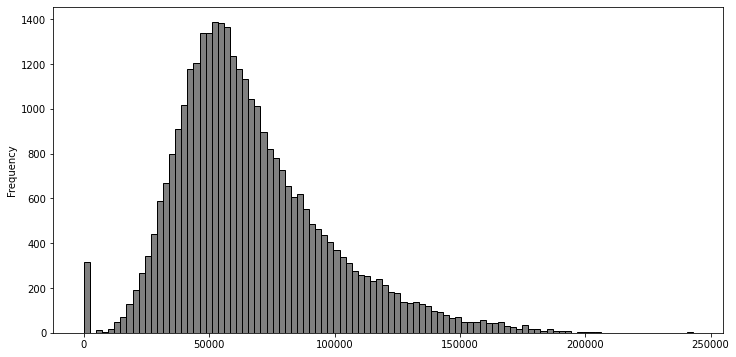

In [40]:
df["Mean"].plot(kind="hist",bins=100,figsize=(12,6),facecolor='grey',edgecolor='black')

<AxesSubplot:ylabel='Frequency'>

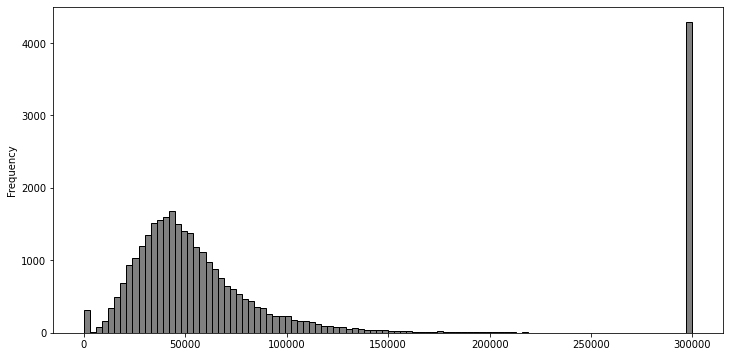

In [41]:
df["Median"].plot(kind="hist",bins=100,figsize=(12,6),facecolor='grey',edgecolor='black')


### Bivariate Analysis

<AxesSubplot:xlabel='State_Name', ylabel='Median'>

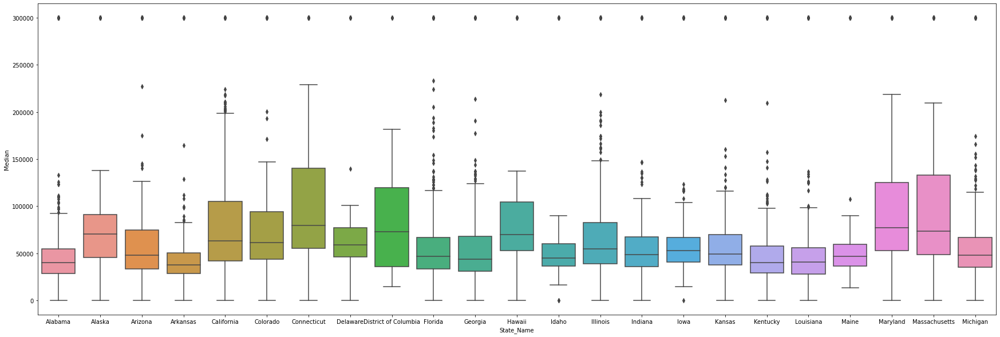

In [42]:
rcParams['figure.figsize'] = 30,10
sns.boxplot(x=df["State_Name"][:15000],y=df["Median"])

#### The Boxplot above shows the presence of outliers

In [43]:
df.corr(method="pearson")

,Lat,Lon,Mean,Median,Stdev
Lat,1.000000,0.004664,0.136266,0.086964,0.117045
Lon,0.004664,1.000000,-0.043835,-0.028488,-0.033599
Mean,0.136266,-0.043835,1.000000,0.541713,0.844316
Median,0.086964,-0.028488,0.541713,1.000000,0.329265
Stdev,0.117045,-0.033599,0.844316,0.329265,1.000000


#### From the correlation matrix, it is clear that the median salary is not correlated with anything but mean salary as the correlation coefficient is very less in others

<AxesSubplot:xlabel='Median', ylabel='Mean'>

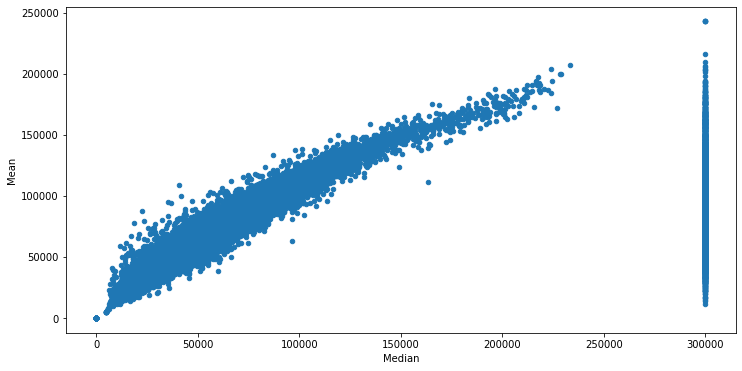

In [44]:
#Strong Correlation
df.plot(kind="scatter",figsize=(12,6),x="Median",y="Mean")

<AxesSubplot:xlabel='Median', ylabel='Lat'>

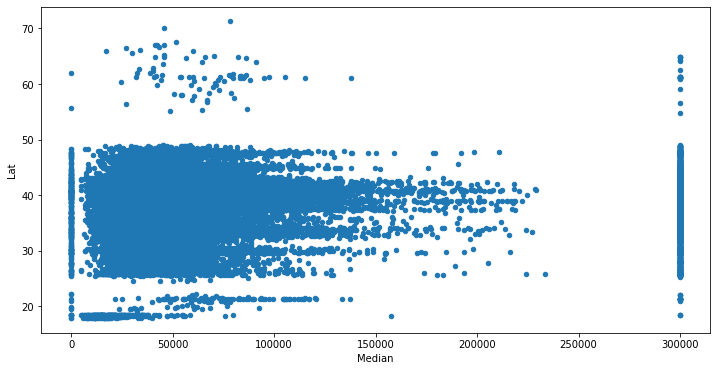

In [45]:
#Negligible Correlation
df.plot(kind="scatter",figsize=(12,6),x="Median",y="Lat")

### Missing Values Treatment

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32526 entries, 0 to 32525
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          32526 non-null  object 
 1   State_Code  32526 non-null  object 
 2   State_Name  32526 non-null  object 
 3   State_ab    32526 non-null  object 
 4   County      32526 non-null  object 
 5   City        32526 non-null  object 
 6   Place       32526 non-null  object 
 7   Type        32526 non-null  object 
 8   Primary     32526 non-null  object 
 9   Zip_Code    32526 non-null  object 
 10  Area_Code   32526 non-null  object 
 11  Lat         32526 non-null  float64
 12  Lon         32526 non-null  float64
 13  Mean        32526 non-null  int64  
 14  Median      32526 non-null  int64  
 15  Stdev       32526 non-null  int64  
dtypes: float64(2), int64(3), object(11)
memory usage: 4.0+ MB


#### Since all the columns are accounted for with no missing values, hence data is clean

### Outliers

In [47]:
df

,id,State_Code,State_Name,State_ab,County,City,Place,Type,Primary,Zip_Code,Area_Code,Lat,Lon,Mean,Median,Stdev
0,1011000,1,Alabama,AL,Mobile County,Chickasaw,Chickasaw city,City,place,36611,251,30.771450,-88.079697,38773,30506,33101
1,1011010,1,Alabama,AL,Barbour County,Louisville,Clio city,City,place,36048,334,31.708516,-85.611039,37725,19528,43789
2,1011020,1,Alabama,AL,Shelby County,Columbiana,Columbiana city,City,place,35051,205,33.191452,-86.615618,54606,31930,57348
3,1011030,1,Alabama,AL,Mobile County,Satsuma,Creola city,City,place,36572,251,30.874343,-88.009442,63919,52814,47707
4,1011040,1,Alabama,AL,Mobile County,Dauphin Island,Dauphin Island,Town,place,36528,251,30.250913,-88.171268,77948,67225,54270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32521,720296,72,Puerto Rico,PR,Adjuntas Municipio,Guaynabo,Adjuntas,Track,Track,970,787,18.397925,-66.130633,30649,13729,37977
32522,7202966,72,Puerto Rico,PR,Adjuntas Municipio,Aguada,Adjuntas,Track,Track,602,787,18.385424,-67.203310,15520,9923,15541
32523,7202976,72,Puerto Rico,PR,Adjuntas Municipio,Aguada,Adjuntas,Track,Track,602,787,18.356565,-67.180686,41933,34054,31539
32524,7202986,72,Puerto Rico,PR,Adjuntas Municipio,Aguada,Adjuntas,Track,Track,602,787,18.412041,-67.213413,0,0,0


In [48]:
x=df["State_Name"].unique()
x

array(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California',
       'Colorado', 'Connecticut', 'Delaware', 'District of Columbia',
       'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana',
       'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland',
       'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi',
       'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire',
       'New Jersey', 'New Mexico', 'New York', 'North Carolina',
       'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania',
       'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee',
       'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
       'West Virginia', 'Wisconsin', 'Wyoming', 'Puerto Rico'],
      dtype=object)

### Removing Outliers

In [49]:
gk=df.groupby("State_Name")

In [50]:
for i in x:
    df1=gk.get_group(i)
    Q1 = df1.Median.quantile(0.25)
    Q3 = df1.Median.quantile(0.75)
    IQR = Q3 - Q1
    df2=df1[(df1.Median < (Q1 - 1.5 * IQR)) |(df1.Median > (Q3 + 1.5 * IQR))]
    df=df.drop(df2.index)
df

,id,State_Code,State_Name,State_ab,County,City,Place,Type,Primary,Zip_Code,Area_Code,Lat,Lon,Mean,Median,Stdev
0,1011000,1,Alabama,AL,Mobile County,Chickasaw,Chickasaw city,City,place,36611,251,30.771450,-88.079697,38773,30506,33101
1,1011010,1,Alabama,AL,Barbour County,Louisville,Clio city,City,place,36048,334,31.708516,-85.611039,37725,19528,43789
2,1011020,1,Alabama,AL,Shelby County,Columbiana,Columbiana city,City,place,35051,205,33.191452,-86.615618,54606,31930,57348
3,1011030,1,Alabama,AL,Mobile County,Satsuma,Creola city,City,place,36572,251,30.874343,-88.009442,63919,52814,47707
4,1011040,1,Alabama,AL,Mobile County,Dauphin Island,Dauphin Island,Town,place,36528,251,30.250913,-88.171268,77948,67225,54270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32521,720296,72,Puerto Rico,PR,Adjuntas Municipio,Guaynabo,Adjuntas,Track,Track,970,787,18.397925,-66.130633,30649,13729,37977
32522,7202966,72,Puerto Rico,PR,Adjuntas Municipio,Aguada,Adjuntas,Track,Track,602,787,18.385424,-67.203310,15520,9923,15541
32523,7202976,72,Puerto Rico,PR,Adjuntas Municipio,Aguada,Adjuntas,Track,Track,602,787,18.356565,-67.180686,41933,34054,31539
32524,7202986,72,Puerto Rico,PR,Adjuntas Municipio,Aguada,Adjuntas,Track,Track,602,787,18.412041,-67.213413,0,0,0


### Variable Transformation: Not needed
### Dimensionality Reduction : Not needed. 
### All the steps of data analysis have been completed successfully and the data can now be used for further purposes.

# Visualizing data using maps

In [51]:
from folium.plugins import FastMarkerCluster
def generateBaseMap(default_location=[39.62428520888125, -95.49939090034717], default_zoom_start=4.5):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map
base_map=generateBaseMap()


In [52]:
callback = ('function (row) {' 
                'var marker = L.marker(new L.LatLng(row[0], row[1]), {color: "red"});'
                "var mark=row[6]>200000?'black':row[6]>100000?'darkblue':row[6]>60000?'blue':row[6]>30000?'red':'purple';"
                'var icon = L.AwesomeMarkers.icon({'
                "icon: 'home',"
                "iconColor: 'white',"
                "markerColor: mark,"
                "prefix: 'glyphicon',"
                "extraClasses: 'fa-rotate-0'"
                    '});'
                'marker.setIcon(icon);'
                "var popup = L.popup({maxWidth: '300'});"
                "const display_text = {text:'State_Name:'+row[2]+'<br> City:'+row[3]+' <br>Zip_Code:'+row[4]+' <br>Area_Code:'+row[5]+' <br>Median:'+row[6]+'$'};"
                "var mytext = $(`<div id='my_text' class='display_text' style='width: 100.0%; height: 200.0%;'> ${display_text.text}</div>`)[0];"
                "popup.setContent(mytext);"
                "marker.bindPopup(popup);"
                'return marker};')
                             
base_map.add_child(FastMarkerCluster(df[['Lat', 'Lon',"State_Name","City","Zip_Code","Area_Code","Median"]].values.tolist(), callback=callback))
# save the map 
folium.TileLayer('Stamen Toner').add_to(base_map)
folium.TileLayer('stamenwatercolor').add_to(base_map)
folium.TileLayer('cartodbpositron').add_to(base_map)
folium.TileLayer('cartodbdark_matter').add_to(base_map)
folium.TileLayer('Stamen Terrain').add_to(base_map)
base_map.add_child(folium.map.LayerControl())


In [53]:
import branca.colormap as cmp
step = cmp.StepColormap(
 ['purple', 'red', 'blue','darkblue','black'],
 vmin=df.Median.min(), vmax=df.Median.max(),
 index=[0, 30000,60000,100000,200000,300000],  #for change in the colors, not used fr linear
 caption='Hosehold Median Income'    #Caption for Color scale or Legend
)
step.add_to(base_map)
base_map

In [54]:
base_map.save("Map.html")

In [56]:
state_median,state_variation={},{}
for i in x:
    state_median[i]=gk.get_group(i)["Median"].mean()
    state_variation[i]=gk.get_group(i)["Stdev"].mean()
for i in state_median:
    if state_median[i]==min(state_median.values()):
        min_median_state=i
    elif state_median[i]==max(state_median.values()):
        max_median_state=i
for i in state_variation:
    if state_variation[i]==min(state_variation.values()):
        min_variance_state=i
    if state_variation[i]==max(state_variation.values()):
        max_variance_state=i
min_median_state,max_median_state,min_variance_state,max_variance_state

('Puerto Rico', 'New Jersey', 'Puerto Rico', 'District of Columbia')

### After thorough data analysis and using visualization techniques, I have concluded that:

#### Min median salary state: Puerto Rico
#### Max median salary state: New Jersey
#### Min variation in salary across state: Puerto Rico
#### Max variation in salary across state: District of Columbia